In [1]:
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import scipy.stats as stats
import seaborn as sns
import pandas as pd
import numpy as np
import backtrader as bt

from plotly.subplots import make_subplots
from pydantic import BaseModel

from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, f1_score, precision_score, recall_score
from utils.common import day_aware_shift, plot_confusion_matrix
from utils.features import create_lag, create_rsi, create_dst, create_ma_ratio, create_z, \
    create_bollinger_band
from utils.model import XGBoostClassifier, LogisticClassifier

import os
import ta
import tabulate
import datetime
import tqdm
import pickle

In [2]:
df_wti_1m = pickle.load(open('./large_files/cl-1m-2.pkl', 'rb'))
df_wti_1m = df_wti_1m[(df_wti_1m['datetime'].dt.time >= datetime.time(hour=7, minute=0)) & (df_wti_1m['datetime'].dt.hour <= 16)]

df = df_wti_1m.copy()
df['month'] = df['datetime'].dt.month
df.head()

,date,time,open,high,low,close,volume,datetime,day,month
525,2007-04-02,0700,65.74,65.77,65.74,65.77,4,2007-04-02 07:00:00-04:00,Monday,4
526,2007-04-02,0701,65.75,65.75,65.70,65.70,20,2007-04-02 07:01:00-04:00,Monday,4
527,2007-04-02,0702,65.72,65.72,65.65,65.66,40,2007-04-02 07:02:00-04:00,Monday,4
528,2007-04-02,0703,65.66,65.68,65.66,65.66,13,2007-04-02 07:03:00-04:00,Monday,4
529,2007-04-02,0704,65.67,65.67,65.62,65.62,18,2007-04-02 07:04:00-04:00,Monday,4


# Day with missing data

In [3]:
missing_data = []
for day, df_day in tqdm.tqdm(df.groupby(pd.Grouper(key='datetime', freq='D'))):
    if df_day.shape[0] == 0:
        continue
    df_day = df_day.copy()
    if df_day.shape[0] < 600:
        missing_data.append((day, df_day.shape[0]))

missing_data = pd.DataFrame(missing_data, columns=['day', 'counts'])
missing_data['day'].dt.year.value_counts()

100%|██████████| 6142/6142 [00:00<00:00, 23563.92it/s]


2008    211
2007    194
2014    145
2009    142
2013    129
2010    118
2012    117
2011    110
2015     70
2020     54
2021     49
2023     42
2022     37
2017     35
2016     33
2019     33
2018     32
2024      8
Name: day, dtype: int64

In [4]:
def feature_pipeline(df):
    df = create_bollinger_band(df, period=20)
    df['dollar_vol'] = df[['close', 'volume']].prod(axis=1)
    for period in [5, 15, 30, 60]:
        df = create_z(df, period, 'close')
        df = create_z(df, period, 'volume')
        df = create_z(df, period, 'dollar_vol')
        df = create_dst(df, [period])
        df = create_rsi(df, [period])

        for sub_period in [5, 15, 30, 60]:
            df = create_lag(df, f'z_close_{period}m', sub_period)
            df = create_lag(df, f'z_volume_{period}m', sub_period)
            df = create_lag(df, f'dst_high_{period}m', sub_period)
            df = create_lag(df, f'dst_low_{period}m', sub_period)

            if sub_period > period:
                df = create_ma_ratio(df, period, sub_period)

    return df

def target_pipeline(df):
    def get_trend(x):
        if x > 0.5:
            return 'up'
        elif x < -0.5:
            return 'down'
        else:
            return 'neutral'
    df['trend_30m_z5'] = df['z_close_30m'].apply(get_trend)
    df = day_aware_shift(df, 'trend_30m_z5', -5)

    return df

In [5]:
df = feature_pipeline(df)
df.info()

lag60m_dst_low_60m: 100%|██████████| 6142/6142 [00:01<00:00, 3933.20it/s]


<class 'pandas.core.frame.DataFrame'>
Int64Index: 2579355 entries, 525 to 92654
Columns: 159 entries, date to lag60m_dst_low_60m
dtypes: category(4), datetime64[ns, America/New_York](1), float64(149), int64(2), object(3)
memory usage: 3.0+ GB


In [7]:
with pd.HDFStore('./large_files/data.h5') as store:
    store.put('feature_engineering/20240124', df, format='table')

/home/quincy/miniconda3/envs/finance/lib/python3.9/site-packages/tables/path.py:137: NaturalNameWarning: object name is not a valid Python identifier: '20240124'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)


In [7]:
with pd.HDFStore('./large_files/data.h5', mode='r') as store:
    df = store.get('feature_engineering/20240124')

In [8]:
df = target_pipeline(df)

In [9]:
df2 = df[df['datetime'].dt.hour >= 9]
df2 = df2[df2['datetime'].dt.hour < 16]
df2 = df2[(df2['datetime'].dt.year >= 2010)]
df2 = df2[(df2['datetime'].dt.year <= 2019)]

# exclude_dates = pd.to_datetime(missing_data['day']).dt.strftime('%Y-%m-%d').tolist()
# df2 = df2[~df2['datetime'].dt.strftime('%Y-%m-%d').isin(exclude_dates)]

df2 = df2[df2['datetime'].dt.day_of_week == 2]
df2.info(show_counts=True, verbose=3)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 216842 entries, 415911 to 1932367
Data columns (total 160 columns):
 #    Column               Non-Null Count   Dtype                           
---   ------               --------------   -----                           
 0    date                 216842 non-null  object                          
 1    time                 216842 non-null  object                          
 2    open                 216842 non-null  float64                         
 3    high                 216842 non-null  float64                         
 4    low                  216842 non-null  float64                         
 5    close                216842 non-null  float64                         
 6    volume               216842 non-null  int64                           
 7    datetime             216842 non-null  datetime64[ns, America/New_York]
 8    day                  216842 non-null  object                          
 9    month                216842 n

In [10]:
to_drop = ['date', 'datetime', 'time', 'day', 'open', 'high', 'low', 'close', 'volume', 'trend_30m_z5'] + \
        [f for f in df.columns if 'sma' in f] + [f for f in df.columns if 'std' in f]

# def x_preprocess(df):
#     df2 = df.dropna(axis=0)
#     df2 = df2.drop(to_drop, axis=1)
#     df2 = df2.copy()
#     df2['month'] = pd.Categorical(df2['month'])
#     df2 = pd.get_dummies(df2, columns=['month'], drop_first=True)

#     return df2

In [11]:
# Wednesday
df2 = df[df['datetime'].dt.hour >= 9]
df2 = df2[df2['datetime'].dt.hour < 16]
df2 = df2[(df2['datetime'].dt.year >= 2010)]
df2 = df2[(df2['datetime'].dt.year <= 2019)]
df2 = df2[df2['datetime'].dt.day_of_week == 2]
df2 = df2.dropna(axis=0)

categorical_columns = ['month'] + [c for c in df2.columns if 'signal' in c]
# df2['month'] = pd.Categorical(df2['month'])
df2 = pd.get_dummies(df2, columns=categorical_columns, drop_first=True, dtype=int)

Xtr = df2[df2['datetime'].dt.year < 2018]
Xvl = df2[df2['datetime'].dt.year == 2018]
Xte = df2[df2['datetime'].dt.year == 2019]

le = LabelEncoder()

ytr = le.fit_transform(Xtr['trend_30m_z5']).reshape(-1, 1)
yvl = le.transform(Xvl['trend_30m_z5']).reshape(-1, 1)
yte = le.transform(Xte['trend_30m_z5']).reshape(-1, 1)

Xtr = Xtr.drop(to_drop, axis=1)
Xvl = Xvl.drop(to_drop, axis=1)
Xte = Xte.drop(to_drop, axis=1)

feature_columns = Xtr.columns.tolist()

Xtr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 172348 entries, 415911 to 1629977
Columns: 140 entries, bb_high to rsi_60_signal_2
dtypes: float64(121), int64(19)
memory usage: 185.4 MB


In [12]:
params = {
    'objective': 'multi:softmax',
    'random_state': 42,
    'learning_rate': 0.05,
    'nthread': -1,
    'max_depth': 5,
    'early_stopping_rounds': 10,
    'tree_method': 'hist',
    # 'enable_categorical': True,
    'num_class': 3,
    'device': 'cuda'
}

xgb = XGBoostClassifier(params=params)
xgb.fit((Xtr, ytr), (Xvl, yvl), le.classes_)

Training XGBClassifier with the following params: {'objective': 'multi:softmax', 'base_score': None, 'booster': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': 'cuda', 'eval_metric': None, 'gamma': None, 'grow_policy': None, 'interaction_constraints': None, 'learning_rate': 0.05, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 5, 'max_leaves': None, 'min_child_weight': None, 'monotone_constraints': None, 'multi_strategy': None, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': None, 'tree_method': 'hist', 'validate_parameters': None, 'verbosity': None, 'nthread': -1, 'num_class': 3}
Training Results:
+-----------+------+
| accuracy  | 0.64 |
| precision | 0.61 |
| recall    | 0.64 |
| f1        | 0.59 |
+-----------+------+

Validation Results:
+-----------+------+
|

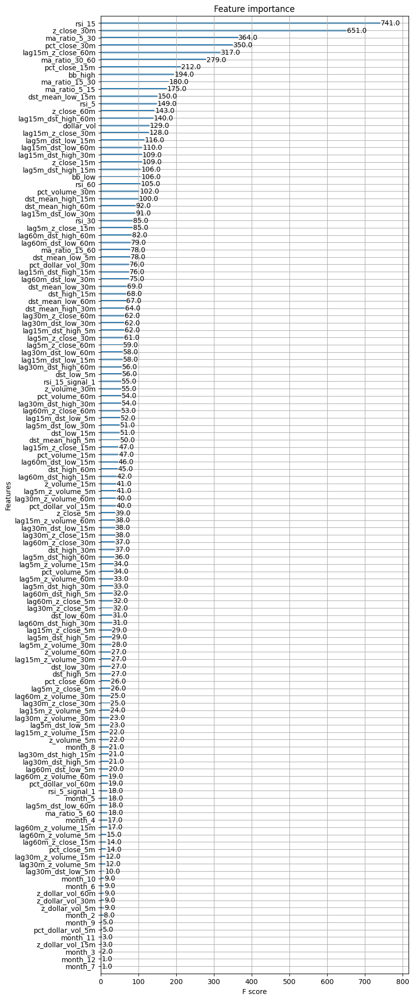

In [13]:
xgb.plot_importance((8, 25))

# Running the model on different days

In [14]:
for day in ['Monday', 'Tuesday', 'Thursday', 'Friday']:
    df_day = df[df['datetime'].dt.day_name() == day]
    df_day = df_day[df_day['datetime'].dt.hour >= 9]
    df_day = df_day[df_day['datetime'].dt.year == 2019]
    df_day = df_day.dropna(axis=0)
    
    y = le.transform(df_day['trend_30m_z5'])
    pre_x = pd.get_dummies(df_day, columns=categorical_columns, drop_first=True)
    X = pre_x[feature_columns]

    y_pred = xgb.model.predict(X)
    print(day)
    print(f'Precision: {precision_score(y, y_pred, average="weighted"):.2f}')
    print(f'Recall: {recall_score(y, y_pred, average="weighted"):.2f}')
    print(f'F1: {f1_score(y, y_pred, average="weighted"):.2f}')
    print()

Monday
Precision: 0.61
Recall: 0.65
F1: 0.60

Tuesday
Precision: 0.62
Recall: 0.65
F1: 0.60

Thursday
Precision: 0.61
Recall: 0.64
F1: 0.60

Friday
Precision: 0.61
Recall: 0.64
F1: 0.60



# Backtrader

# Backtest Groundtruth Signal

In [15]:
lines = tuple(pre_x.select_dtypes(exclude='object').columns.tolist() + ['target'])
class PandasData(bt.feeds.PandasData):
    lines = lines
    params = {c: -1 for c in lines}
    params = tuple(params.items())

In [16]:
class Order(BaseModel):
    timestamp: datetime.datetime
    size: int
    action: str
    price: float

class XGBoostStrategy(bt.Strategy):
    def __init__(self):
        self.data_predicted = None
        self.track = []

    def next(self):
        bar = self.datas[0]
        df = pd.DataFrame({f: getattr(bar, f)[0] for f in feature_columns}, index=[0], columns=feature_columns)

        y = int(bar.target[0])
        trend = le.inverse_transform([y])[0]

        for order in self.track:
            time_diff = bar.datetime.datetime() - order.timestamp
            if time_diff == datetime.timedelta(minutes=5):
                if order.action == 'buy':
                    holdings = self.getposition(self.data).size
                    sell_size = holdings if holdings < order.size else order.size
                    self.sell(size=sell_size, exectype=bt.Order.Market)
                    self.log(f'SELL {sell_size}: previously bought ({order.size}) {order.price}')
                elif order.action == 'sell':
                    self.buy(size=order.size, exectype=bt.Order.Market)
                    self.log(f'BUY {order.size}: previously sold {order.price}')

        if trend == 'up':
            size = int(self.broker.get_cash() / bar.close[0] * 0.5)
            if size > 1:
                self.log(f'BUY {size} at {self.data.close[0]:.2f}')
                self.order = self.buy(size=size, exectype=bt.Order.Market)
                self.track.append(
                    Order(timestamp=self.datas[0].datetime.datetime(), size=size, action='buy', price=bar.close[0])
                )
            else:
                self.log(f'Not enough cash')
        elif trend == 'down':
            size = int(self.getposition(self.data).size * 0.5)
            if size > 0:
                self.log(f'SELL {size} at {bar.close[0]:.2f}')
                self.order = self.sell(size=size, exectype=bt.Order.Market)
                self.track.append(
                    Order(timestamp=self.datas[0].datetime.datetime(), size=size, action='sell', price=bar.close[0])
                )
            else:
                self.log(f'No shares to sell')
        else:
            self.log(f'No Action')

    def notify_order(self, order):
        if order.status in [order.Submitted, order.Accepted]:
            # Buy/Sell order submitted/accepted to/by broker - Nothing to do
            # self.log('ORDER ACCEPTED/SUBMITTED', dt=order.created.dt)
            self.order = order
            return

        if order.status in [order.Expired]:
            self.log('BUY EXPIRED')

        elif order.status in [order.Completed]:
            if order.isbuy():
                self.log(f'BUY EXECUTED: Price: {order.executed.price:.2f} Size: {order.executed.size}')

            else:  # Sell
                self.log(f'SELL EXECUTED: Price: {order.executed.price:.2f} Size: {order.executed.size}')

        # Sentinel to None: new orders allowed
        self.order = None

    def log(self, txt, dt=None):
        dt = dt or self.datas[0].datetime.datetime()
        print(
            f'{dt}: Cash: {self.broker.getcash():.2f} Portfolio: {self.broker.getvalue():.2f} Action: {txt}'
        )

In [17]:
df2 = df[df['datetime'].dt.hour >= 9]
df2 = df2[df2['datetime'].dt.hour < 16]
df2 = df2[(df2['datetime'].dt.year == 2019)]
df2 = df2[df2['datetime'].dt.day_of_week == 2]
df2 = df2.dropna(axis=0)

cash = 100000.0
count = 0
pnl = []
for day, df_day in df2.groupby(pd.Grouper(key='datetime', freq='D')):
    if df_day.shape[0] == 0:
        continue
    df_day = df_day.set_index('datetime', drop=False)
    df_day = df_day.copy()
    df_day = df_day.dropna(axis=0)
    df_day['target'] = le.transform(df_day['trend_30m_z5'])
    
    df_day = df_day.select_dtypes(exclude='object')
    
    data_feed = PandasData(dataname=df_day)
    cerebro = bt.Cerebro()
    cerebro.addanalyzer(bt.analyzers.PyFolio, _name='pyfolio')
    cerebro.addstrategy(XGBoostStrategy)
    cerebro.adddata(data_feed, name=day.strftime('%Y%m%d'))

    cerebro.broker.setcash(cash)
    results = cerebro.run()
    print(f'{day.date()} Ending Portfolio Value: {cerebro.broker.getvalue():.2f}')
    print('\n\n')
    pnl.append(np.round(cerebro.broker.getvalue() - cash, 2))

print(f'PnL: {np.sum(pnl)} Avg: {np.mean(pnl)}')

2019-01-02 14:00:00: Cash: 100000.00 Portfolio: 100000.00 Action: No shares to sell
2019-01-02 14:01:00: Cash: 100000.00 Portfolio: 100000.00 Action: No shares to sell
2019-01-02 14:02:00: Cash: 100000.00 Portfolio: 100000.00 Action: No shares to sell
2019-01-02 14:03:00: Cash: 100000.00 Portfolio: 100000.00 Action: No shares to sell
2019-01-02 14:04:00: Cash: 100000.00 Portfolio: 100000.00 Action: No shares to sell
2019-01-02 14:05:00: Cash: 100000.00 Portfolio: 100000.00 Action: No shares to sell
2019-01-02 14:06:00: Cash: 100000.00 Portfolio: 100000.00 Action: No Action
2019-01-02 14:07:00: Cash: 100000.00 Portfolio: 100000.00 Action: BUY 1121 at 44.59
2019-01-02 14:08:00: Cash: 50025.82 Portfolio: 99988.79 Action: BUY EXECUTED: Price: 44.58 Size: 1121
2019-01-02 14:08:00: Cash: 50025.82 Portfolio: 99988.79 Action: No Action
2019-01-02 14:09:00: Cash: 50025.82 Portfolio: 99966.37 Action: BUY 561 at 44.55
2019-01-02 14:10:00: Cash: 25027.66 Portfolio: 100061.68 Action: BUY EXECUTED: 

# Backtest XGBoost Model

In [23]:
df2 = df[df['datetime'].dt.hour >= 9]
df2 = df2[df2['datetime'].dt.hour < 16]
df2 = df2[(df2['datetime'].dt.year == 2019)]
df2 = df2[df2['datetime'].dt.day_of_week == 2]
df2 = df2.dropna(axis=0)
df2 = pd.get_dummies(df2, columns=categorical_columns, drop_first=True, dtype=int)

cash = 100000.0
count = 0
pnl = []
for day, df_day in df2.groupby(pd.Grouper(key='datetime', freq='D')):
    if df_day.shape[0] == 0:
        continue
    df_day = df_day.set_index('datetime', drop=False)
    df_day = df_day.copy()
    df_day = df_day.dropna(axis=0)

    df_day['target'] = xgb.model.predict(df_day[feature_columns])
    data_feed = PandasData(dataname=df_day)
    cerebro = bt.Cerebro()
    cerebro.addanalyzer(bt.analyzers.PyFolio, _name='pyfolio')
    cerebro.addstrategy(XGBoostStrategy)
    cerebro.adddata(data_feed, name=day.strftime('%Y%m%d'))

    cerebro.broker.setcash(cash)
    results = cerebro.run()
    print(f'{day.date()} Ending Portfolio Value: {cerebro.broker.getvalue():.2f}')
    print('\n\n')
    pnl.append(np.round(cerebro.broker.getvalue() - cash, 2))

print(f'PnL: {np.sum(pnl)} Avg: {np.mean(pnl)}')

2019-01-02 14:00:00: Cash: 100000.00 Portfolio: 100000.00 Action: BUY 1116 at 44.79
2019-01-02 14:01:00: Cash: 50014.36 Portfolio: 99933.04 Action: BUY EXECUTED: Price: 44.79 Size: 1116
2019-01-02 14:01:00: Cash: 50014.36 Portfolio: 99933.04 Action: BUY 559 at 44.73
2019-01-02 14:02:00: Cash: 25010.29 Portfolio: 99899.54 Action: BUY EXECUTED: Price: 44.73 Size: 559
2019-01-02 14:02:00: Cash: 25010.29 Portfolio: 99899.54 Action: BUY 279 at 44.71
2019-01-02 14:03:00: Cash: 12536.20 Portfolio: 99743.22 Action: BUY EXECUTED: Price: 44.71 Size: 279
2019-01-02 14:03:00: Cash: 12536.20 Portfolio: 99743.22 Action: SELL 977 at 44.63
2019-01-02 14:04:00: Cash: 56149.48 Portfolio: 99762.76 Action: SELL EXECUTED: Price: 44.64 Size: -977
2019-01-02 14:04:00: Cash: 56149.48 Portfolio: 99762.76 Action: SELL 488 at 44.64
2019-01-02 14:05:00: Cash: 77938.68 Portfolio: 99757.86 Action: SELL EXECUTED: Price: 44.65 Size: -488
2019-01-02 14:05:00: Cash: 77938.68 Portfolio: 99757.86 Action: SELL 489: previo

In [24]:
pnl

[2430.71,
 1328.94,
 98.13,
 -1073.86,
 -279.85,
 -346.72,
 61.83,
 1023.45,
 -159.61,
 402.19,
 208.87,
 811.26,
 -324.98,
 -240.17,
 -614.87,
 -287.49,
 -620.33,
 597.85,
 934.56,
 415.44,
 -695.57,
 2304.64,
 -2030.18,
 -2123.76,
 29.66,
 597.72,
 -434.15,
 287.46,
 -251.24,
 -554.14,
 -219.61,
 1082.63,
 -979.88,
 -368.93,
 -185.15,
 193.13,
 -2097.92,
 -1064.9,
 762.56,
 -1098.37,
 779.53,
 -471.24,
 2068.56,
 -506.08,
 -536.28,
 554.43,
 1936.59,
 -830.75,
 1019.02,
 80.85,
 -343.47]

In [25]:
pyfolio_analyzer = results[0].analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfolio_analyzer.get_pf_items()

In [28]:
df2 = df[df['datetime'].dt.hour >= 9]
df2 = df2[df2['datetime'].dt.hour < 16]
df2 = df2[(df2['datetime'].dt.year == 2018)]
df2 = df2[df2['datetime'].dt.day_of_week == 2]
df2 = df2.dropna(axis=0)

y_pred = le.inverse_transform(xgb.model.predict(Xvl))
df2['pred'] = y_pred

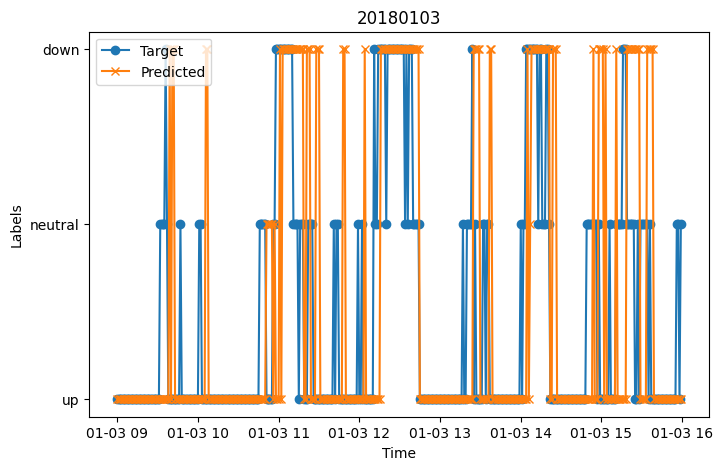

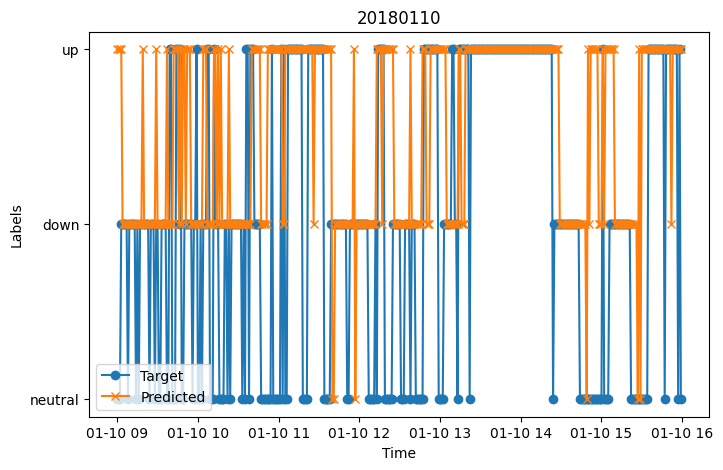

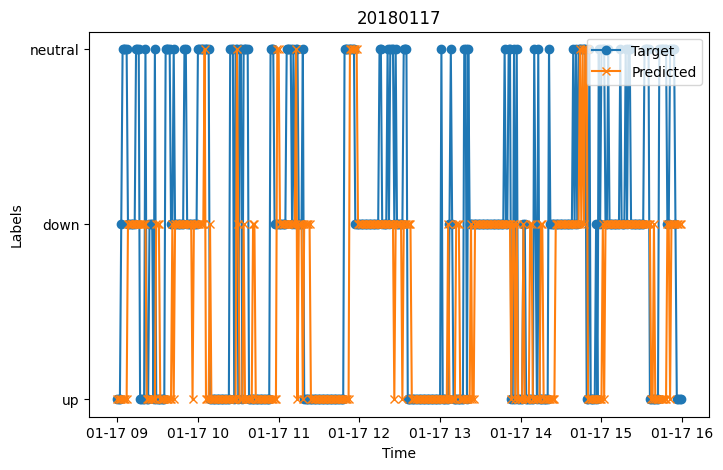

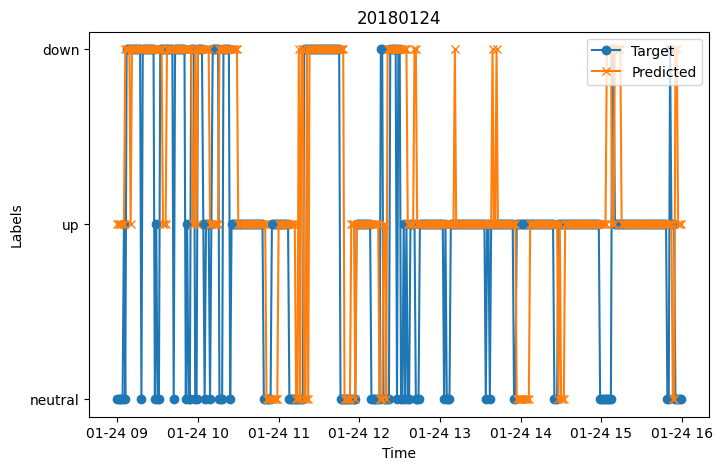

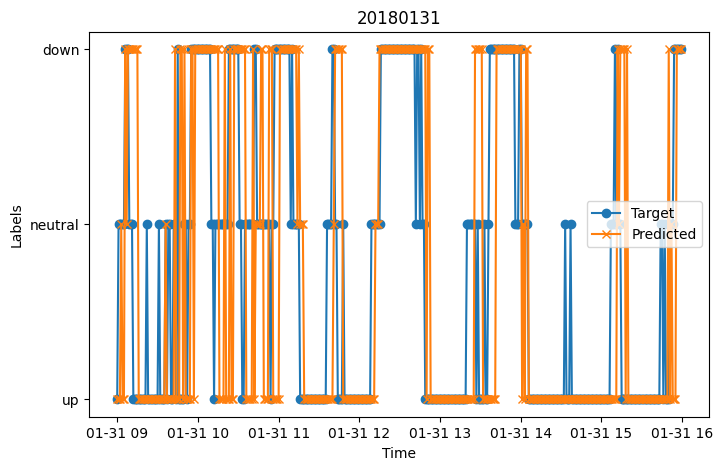

...

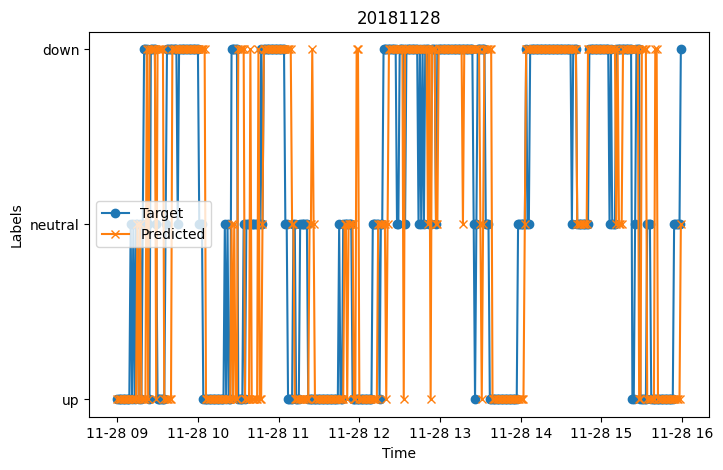

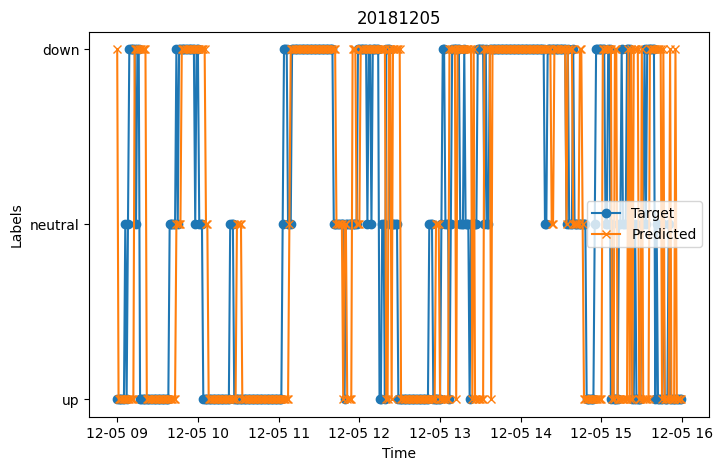

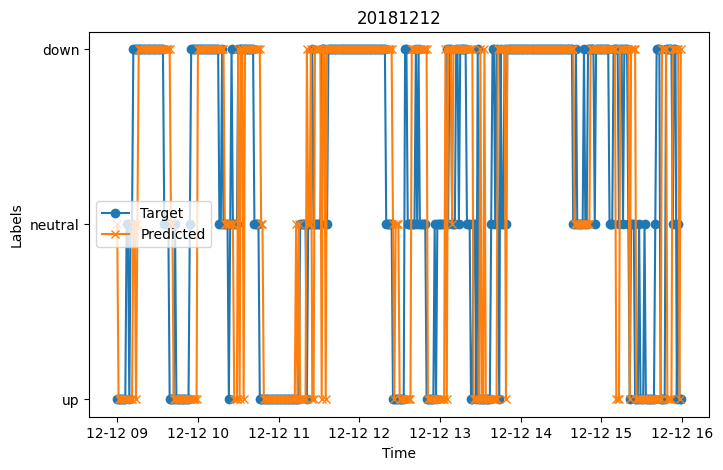

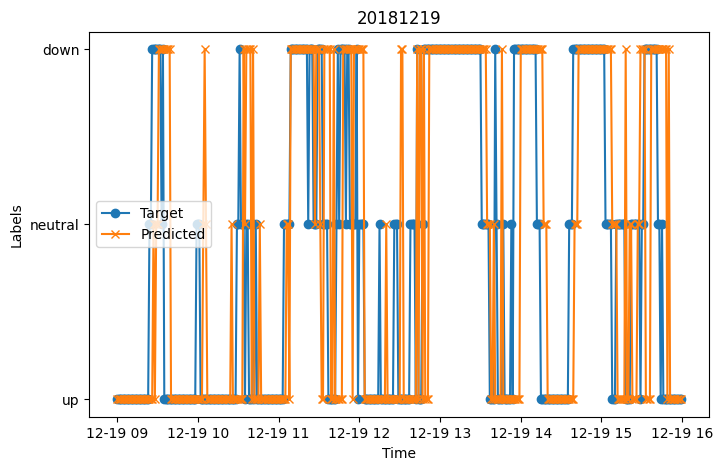

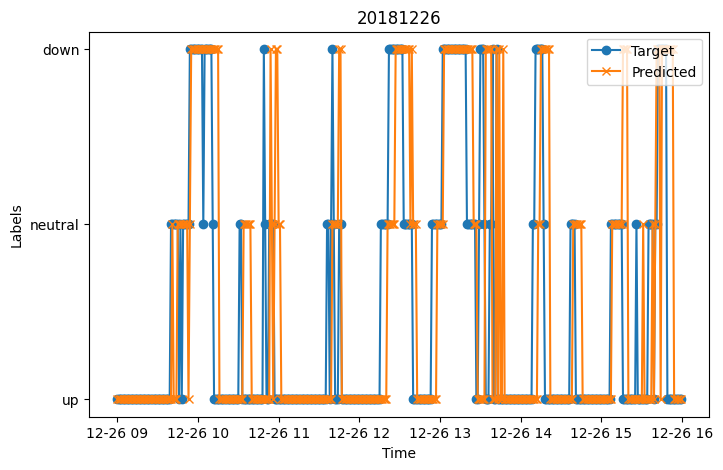

In [29]:
for day, df_day in df2.groupby(pd.Grouper(key='datetime', freq='D')):
    if df_day.shape[0] == 0:
        continue
    plt.figure(figsize=(8, 5))
    plt.plot(df_day['datetime'], df_day['trend_30m_z5'], label='Target', marker='o')
    plt.plot(df_day['datetime'], df_day['pred'], label='Predicted', marker='x')
    plt.xlabel('Time')
    plt.ylabel('Labels')
    plt.legend()
    plt.title(day.strftime('%Y%m%d'))
    plt.show()